# 0. Imports

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Loading Data

In [3]:
from google.colab import drive
drive.mount('/content/drive/', force_remount = True)

Mounted at /content/drive/


In [4]:
!cd drive
!ls

drive  sample_data


In [5]:
path = '/content/drive/My Drive/DAT490Team/sample_merged_data.csv'
data = pd.read_csv(path)

Dataset Sources:
- Full (https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents?resource=download)
- Sampled (https://drive.google.com/file/d/1U3u8QYzLjnEaSurtZfSAS_oh9AT2Mn8X/edit)

In [10]:
print(f"Columns in the DataFrame: {data.columns}")


Columns in the DataFrame: Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State_x', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'State_Full', 'State_y', 'Population'],
      dtype='object')


In [11]:
# Convert 'Start_Time' and 'End_Time' to datetime format for filtering
data['Start_Time'] = pd.to_datetime(data['Start_Time'], errors='coerce')
data['End_Time'] = pd.to_datetime(data['End_Time'], errors='coerce')

# Filter out data from 2023
print(f"Original number of rows: {data.shape[0]}")
data = data[data['Start_Time'].dt.year != 2023]

# Drop the year 2016 from the dataset
data = data[data['Start_Time'].dt.year > 2016]  # Keep only 2017 and later

print(f"Number of rows after dropping 2016 and 2023 data: {data.shape[0]}")

Original number of rows: 500000
Number of rows after dropping 2016 and 2023 data: 414537


In [19]:
# 1. Print column names
print("=== Column Names After Standardization ===")
print(data.columns)

# 2. Check data types
print("=== Data Types ===")
print(data.dtypes)

# 3. Verify remaining missing values
print("=== Remaining Missing Values ===")
remaining_missing_values = data.isnull().sum()
print(remaining_missing_values[remaining_missing_values > 0])

# 4. Summary statistics
print("=== Summary Statistics ===")
print(data.describe())

# 5. Display the first few rows
print("=== First Few Rows After Cleaning ===")
print(data.head())


=== Column Names After Standardization ===
Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State_x', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'State_Full', 'State_y', 'Population'],
      dtype='object')
=== Data Types ===
ID                               object
Source                           object
Severity                          int64
Start_Time               datetime64


=== Distribution Check for Key Numerical Columns ===


array([[<Axes: title={'center': 'Temperature(F)'}>,
        <Axes: title={'center': 'Distance(mi)'}>],
       [<Axes: title={'center': 'Humidity(%)'}>,
        <Axes: title={'center': 'Pressure(in)'}>],
       [<Axes: title={'center': 'Visibility(mi)'}>, <Axes: >]],
      dtype=object)

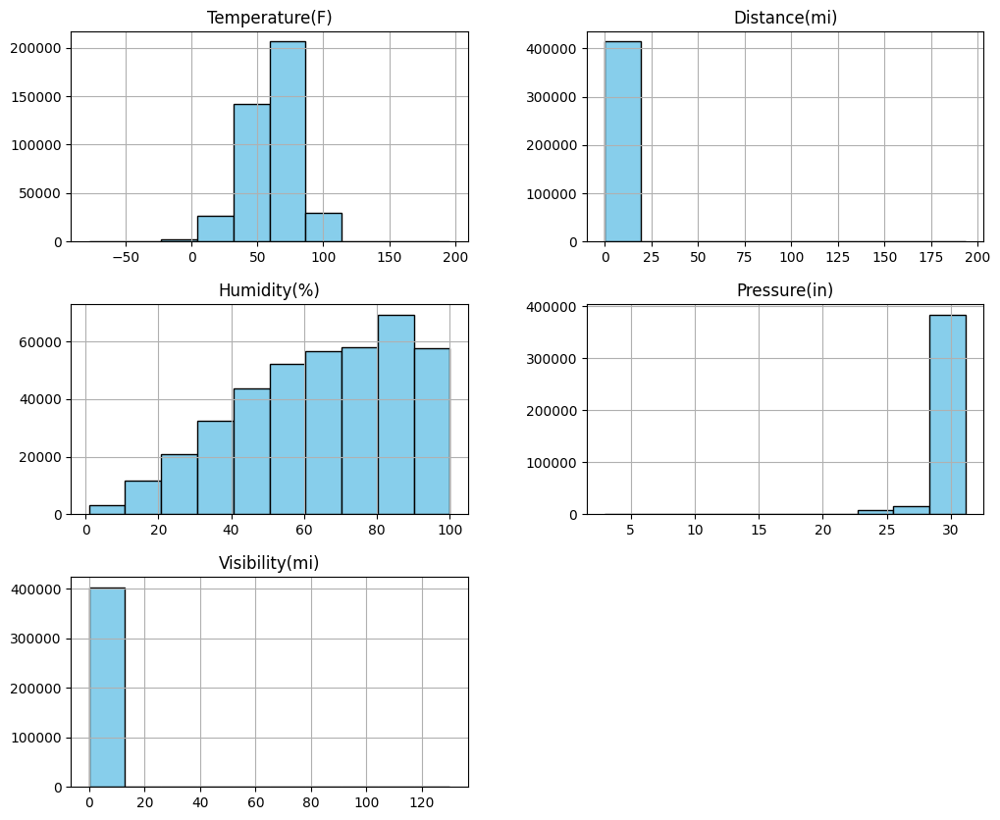

In [21]:
# Examine the distribution of key numerical columns to identify anomalies
print("\n=== Distribution Check for Key Numerical Columns ===")

# Using the exact column names from the DataFrame
key_numerical_cols = ['Temperature(F)', 'Distance(mi)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)']

# Plotting histograms for the key numerical columns
data[key_numerical_cols].hist(figsize=(12, 10), color='skyblue', edgecolor='black')


# 2. Data Cleaning

In [22]:
# Check the basic structure and general information of the dataset
print("=== Basic Information ===")
print(data.info())

# View the first few rows to get a sense of the data content
print("\n=== First Few Rows ===")
print(data.head())

# Summarize the dataset for numerical columns
print("\n=== Summary Statistics for Numerical Columns ===")
print(data.describe())

# Identify the total number of missing values for each column
print("\n=== Missing Values Per Column ===")
missing_values = data.isnull().sum()
print(missing_values[missing_values > 0])

# Check for duplicates in the dataset
print("\n=== Number of Duplicated Rows ===")
print(data.duplicated().sum())

# Get a list of all columns and their unique value counts for categorical columns
print("\n=== Unique Values in Categorical Columns ===")
for col in data.select_dtypes(include='object').columns:
    unique_values = data[col].nunique()
    print(f"Column '{col}' has {unique_values} unique values.")

# Look at unique values for each categorical column to spot inconsistencies
print("\n=== Example Unique Values in Key Categorical Columns ===")
for col in ['Weather_Condition', 'Source', 'Sunrise_Sunset', 'State_x', 'State_y']:
    if col in data.columns:
        print(f"\nColumn: {col}")
        print(data[col].value_counts().head(10))  # Show the top 10 unique values and counts for each key column


=== Basic Information ===
<class 'pandas.core.frame.DataFrame'>
Index: 414537 entries, 0 to 499999
Data columns (total 49 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ID                     414537 non-null  object        
 1   Source                 414537 non-null  object        
 2   Severity               414537 non-null  int64         
 3   Start_Time             414537 non-null  datetime64[ns]
 4   End_Time               414537 non-null  datetime64[ns]
 5   Start_Lat              414537 non-null  float64       
 6   Start_Lng              414537 non-null  float64       
 7   End_Lat                212487 non-null  float64       
 8   End_Lng                212487 non-null  float64       
 9   Distance(mi)           414537 non-null  float64       
 10  Description            414536 non-null  object        
 11  Street                 414013 non-null  object        
 12  City                   

In [58]:
# Step 1: Fill Missing Values for Categorical Columns Using `.loc`
categorical_columns_fill = {
    'Description': 'Unknown',
    'Street': 'Unknown',
    'Timezone': data['Timezone'].mode()[0],  # Fill with the most common timezone
    'Airport_Code': 'Unknown',
    'Sunrise_Sunset': 'Unknown',
    'Civil_Twilight': 'Unknown',
    'Nautical_Twilight': 'Unknown',
    'Astronomical_Twilight': 'Unknown',
    'State_y': data['State_y'].mode()[0]      # Fill with the most common State_y value
}

# Apply the imputation for categorical columns using .loc
for col, value in categorical_columns_fill.items():
    if col in data.columns:
        data.loc[:, col] = data.loc[:, col].fillna(value)
    else:
        print(f"Warning: '{col}' not found in the DataFrame.")

# Step 2: Handle Missing Numerical Data Using Median Values
numerical_columns_fill = {
    'End_Lat': data['Start_Lat'].median(),
    'End_Lng': data['Start_Lng'].median(),
    'Wind_Chill(F)': data['Wind_Chill(F)'].median(),
    'Precipitation(in)': data['Precipitation(in)'].median(),
    'Population': data['Population'].median()
}

# Apply the imputation for numerical columns using .loc
for col, value in numerical_columns_fill.items():
    if col in data.columns:
        data.loc[:, col] = data.loc[:, col].fillna(value)
    else:
        print(f"Warning: '{col}' not found in the DataFrame.")

# Step 3: Handle 'Start_Time' and 'End_Time' Columns
# Drop rows with missing 'Start_Time' since it's crucial for time-series analysis
data = data.dropna(subset=['Start_Time'])

# Step 4: Correct the inplace fill for 'Weather_Timestamp' using .loc
data.loc[:, 'Weather_Timestamp'] = data['Weather_Timestamp'].fillna('Unknown')

# Step 5: Recheck Remaining Missing Values After Imputation
print("\n=== Remaining Missing Values After Imputation ===")
remaining_missing_values = data.isnull().sum()
print(remaining_missing_values[remaining_missing_values > 0])

# Step 6: Display the First Few Rows After Handling Missing Values
print("\n=== First Few Rows After Handling Missing Values ===")
print(data.head())



=== Remaining Missing Values After Imputation ===
City                    13
Zipcode                 96
Temperature(F)        8660
Humidity(%)           9202
Pressure(in)          7388
Visibility(mi)        9205
Wind_Direction        9275
Wind_Speed(mph)      30211
Weather_Condition     9117
dtype: int64

=== First Few Rows After Handling Missing Values ===
          ID   Source  Severity          Start_Time            End_Time  \
0  A-2047758  Source2         2 2019-06-12 10:10:56 2019-06-12 10:55:58   
3  A-4237356  Source1         2 2022-02-21 17:43:04 2022-02-21 19:43:23   
4  A-6690583  Source1         2 2020-12-04 01:46:00 2020-12-04 04:13:09   
5  A-1101469  Source2         2 2021-03-29 07:03:58 2021-03-29 08:51:01   
6  A-7222249  Source1         2 2020-01-14 16:49:23 2020-01-14 20:49:23   

   Start_Lat   Start_Lng    End_Lat     End_Lng  Distance(mi)  ...  \
0  30.641211  -91.153481  35.806927  -87.648567         0.000  ...   
3  43.680592  -92.993317  43.680574  -92.972223 

In [59]:
# Exploring "state not found category"
# Filter the rows where the state is 'state not found'
state_not_found_data = data[data['State_Full'] == 'state not found']

# Display the number of rows and the first few entries
print(f"Number of entries with 'state not found': {state_not_found_data.shape[0]}")
print(state_not_found_data.head())


Number of entries with 'state not found': 0
Empty DataFrame
Columns: [ID, Source, Severity, Start_Time, End_Time, Start_Lat, Start_Lng, End_Lat, End_Lng, Distance(mi), Description, Street, City, County, State_x, Zipcode, Country, Timezone, Airport_Code, Weather_Timestamp, Temperature(F), Wind_Chill(F), Humidity(%), Pressure(in), Visibility(mi), Wind_Direction, Wind_Speed(mph), Precipitation(in), Weather_Condition, Amenity, Bump, Crossing, Give_Way, Junction, No_Exit, Railway, Roundabout, Station, Stop, Traffic_Calming, Traffic_Signal, Turning_Loop, Sunrise_Sunset, Civil_Twilight, Nautical_Twilight, Astronomical_Twilight, State_Full, State_y, Population, month, year]
Index: []

[0 rows x 51 columns]


In [60]:
# Part of Preprocessing
# Update the 'state not found' entries with the corrected state values
data.loc[data['State_Full'] == 'state not found', 'State_Full'] = 'District of Columbia'
data.loc[data['State_Full'] == 'District of Columbia', 'State_y'] = 'DC'

# Verify the updates
print(data[data['State_Full'] == 'District of Columbia'].head())


             ID   Source  Severity          Start_Time            End_Time  \
475   A-4444957  Source1         2 2022-12-17 17:16:00 2022-12-17 17:36:30   
489   A-6514421  Source1         2 2021-02-15 18:15:00 2021-02-15 18:51:30   
654   A-3708185  Source1         2 2022-12-18 19:45:32 2022-12-18 21:00:33   
789   A-6868356  Source1         2 2020-12-30 01:56:58 2020-12-30 03:16:22   
1148  A-1360925  Source2         2 2020-10-28 05:19:06 2020-10-28 06:33:51   

      Start_Lat  Start_Lng    End_Lat    End_Lng  Distance(mi)  ...  \
475   38.902629 -77.014584  38.904525 -77.015847         0.148  ...   
489   38.871308 -76.984005  38.873403 -76.990593         0.383  ...   
654   38.847656 -77.007189  38.851499 -77.006688         0.267  ...   
789   38.879102 -77.038933  38.874522 -77.043513         0.401  ...   
1148  38.925579 -76.988113  35.806927 -87.648567         0.000  ...   

     Turning_Loop Sunrise_Sunset Civil_Twilight Nautical_Twilight  \
475         False          Night   

In [61]:
# Part of Preprocessing
# Updating population for DC
# Step 1: Create a dictionary with the population data for each year
dc_population_by_year = {
    2017: 693972,
    2018: 702455,
    2019: 705749,
    2020: 689545,
    2021: 670050,
    2022: 670050  # Using the same value for 2022 as for 2021
}

# Update the 'Population' column for rows where 'State_y' is 'DC'
data['Population'] = data.apply(lambda row: dc_population_by_year[row['year']] if row['State_y'] == 'DC' else row['Population'], axis=1)

# Verify the update
print("\n=== Population Data After Update ===")
print(data[data['State_y'] == 'DC'][['State_Full', 'State_y', 'Population', 'year']].head())



=== Population Data After Update ===
                State_Full State_y  Population  year
475   District of Columbia      DC    670050.0  2022
489   District of Columbia      DC    670050.0  2021
654   District of Columbia      DC    670050.0  2022
789   District of Columbia      DC    689545.0  2020
1148  District of Columbia      DC    689545.0  2020


# 3. EDA

## Visualizations

In [70]:
# Overall State Distribution using Full State names
overall_state_distribution = data['State_Full'].value_counts()
print("=== Overall State Distribution ===")
print(overall_state_distribution)

# Yearly State Distribution using Full State names
yearly_state_distribution = data.groupby(['year', 'State_Full']).size().unstack(fill_value=0)
print("\n=== Yearly State Distribution ===")
print(yearly_state_distribution)

# Monthly State Distribution using Full State names
monthly_state_distribution = data.groupby(['year', 'month', 'State_Full']).size().unstack(fill_value=0)
print("\n=== Monthly State Distribution ===")
print(monthly_state_distribution)



=== Overall State Distribution ===
State_Full
california              89532
florida                 46160
texas                   31116
south carolina          22117
north carolina          19101
new york                18347
virginia                15908
pennsylvania            15229
minnesota               10481
oregon                  10140
tennessee                9567
arizona                  9558
illinois                 9147
georgia                  8972
louisiana                8590
michigan                 8510
maryland                 7451
new jersey               7243
alabama                  6196
ohio                     6195
washington               5929
utah                     5655
colorado                 5138
oklahoma                 5109
missouri                 4135
indiana                  3791
connecticut              3656
massachusetts            3576
kentucky                 2007
wisconsin                1864
nebraska                 1458
iowa                    

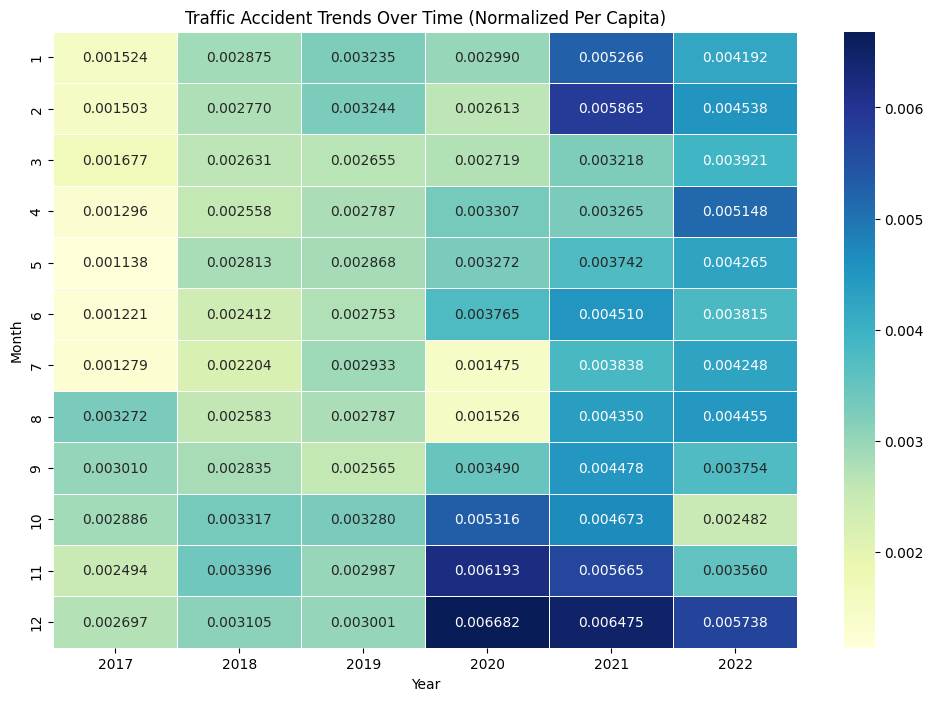

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure 'Start_Time' is in datetime format
data['Start_Time'] = pd.to_datetime(data['Start_Time'], errors='coerce')

# Create a 'month' column for grouping purposes
data['month'] = data['Start_Time'].dt.month

# Extract the 'year' column from the datetime field for grouping
data['year'] = data['Start_Time'].dt.year

# Calculate accidents per capita for each Year-Month combination
# Group by Year and Month, then calculate the accidents per capita
monthly_per_capita = data.groupby(['year', 'month']).agg(
    total_accidents=('Severity', 'size'),   # Count of total accidents
    mean_population=('Population', 'mean')  # Mean population for normalization
).reset_index()

# Calculate accidents per capita
monthly_per_capita['accidents_per_capita'] = monthly_per_capita['total_accidents'] / monthly_per_capita['mean_population']

# Create a pivot table to use for the heatmap
heatmap_data = monthly_per_capita.pivot(index="month", columns="year", values="accidents_per_capita")

# Generate the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".6f", linewidths=.5)
plt.title('Traffic Accident Trends Over Time (Normalized Per Capita)')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()


In [72]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# This heatmap is for WHEN ACCIDENTS ARE OCCURING MORE FREQUENTLY
# Time based analysis

# Create a subset for heatmap using the correct column names
heatmap_data = data[['Start_Lat', 'Start_Lng', 'Population']].dropna()

# Verify the structure to ensure the correct columns are used
print(heatmap_data.head())

# Create a folium map centered on the average location
map_center = [heatmap_data['Start_Lat'].mean(), heatmap_data['Start_Lng'].mean()]
m = folium.Map(location=map_center, zoom_start=5)

# Create a heatmap layer using lat/lng and population data
HeatMap(data=heatmap_data[['Start_Lat', 'Start_Lng', 'Population']].values, radius=10).add_to(m)

# Display the map
m



   Start_Lat   Start_Lng  Population
0  30.641211  -91.153481    905910.0
3  43.680592  -92.993317     40059.0
4  35.395484 -118.985176    905910.0
5  42.532082  -70.944267    807791.0
6  42.421280 -123.119450    223620.0


In [66]:
import folium
from folium.plugins import HeatMap
from IPython.display import IFrame

# This heatmap is for WHERE ACCIDENTS ARE HAPPENING
# Location based analysis
# Make sure to use the correct column names from your DataFrame
heatmap_data = data[['Start_Lat', 'Start_Lng', 'Population']].dropna()

# Create a base map centered at the average location
map_center = [heatmap_data['Start_Lat'].mean(), heatmap_data['Start_Lng'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=5)

# Use Population or any other relevant metric for heatmap intensity
heat_data = [[row['Start_Lat'], row['Start_Lng'], row['Population']] for index, row in heatmap_data.iterrows()]

# Add a HeatMap layer to the base map
HeatMap(data=heat_data, radius=10, max_zoom=13).add_to(folium_map)

# Save the map as an HTML file
folium_map.save("accidents_per_capita_map.html")

# Display the map directly in the notebook
display(IFrame("accidents_per_capita_map.html", width=800, height=600))


In [67]:
# List all files in the current working directory
!ls

from IPython.display import IFrame

# Display the HTML file within the notebook
display(IFrame("accidents_per_capita_map.html", width=800, height=600))

from google.colab import files

# Download the HTML file to your local system
files.download("accidents_per_capita_map.html")


accidents_per_capita_map.html  drive  sample_data


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

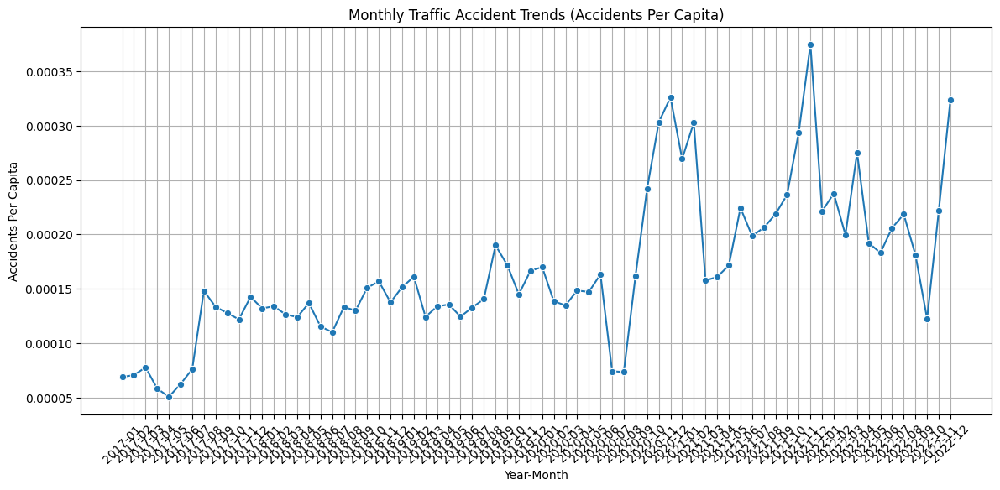

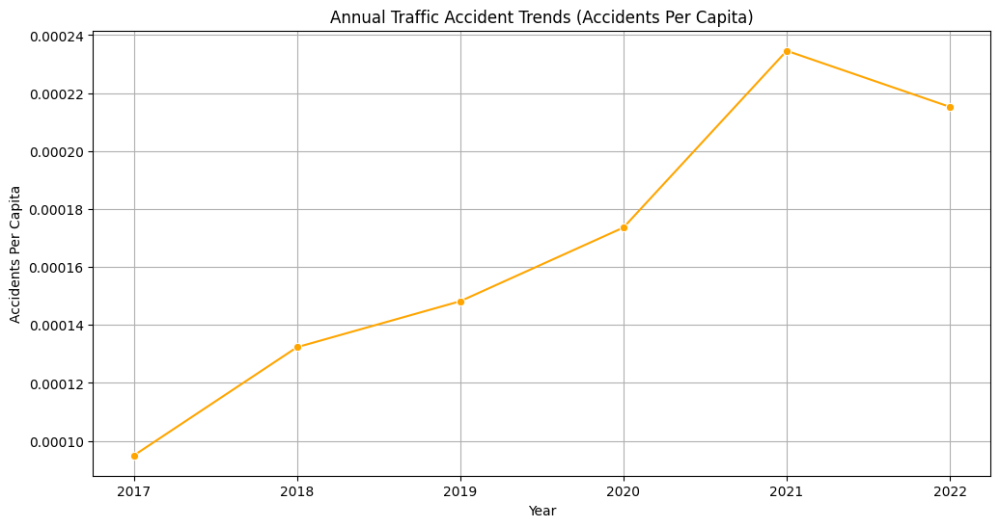


=== Preview of Monthly Trends Per Capita Data ===
  year_month  total_accidents  mean_population  accidents_per_capita  year
0    2017-01             3586    887320.837020              0.000069  2017
1    2017-02             3374    859520.643682              0.000071  2017
2    2017-03             3718    910292.384328              0.000078  2017
3    2017-04             3164    880543.634145              0.000058  2017
4    2017-05             2639    876262.390572              0.000051  2017
5    2017-06             2904    882167.848338              0.000063  2017
6    2017-07             2744    845322.736234              0.000076  2017
7    2017-08             5334    846781.238627              0.000148  2017
8    2017-09             5043    845837.323340              0.000134  2017
9    2017-10             4822    826347.138332              0.000128  2017

=== Preview of Annual Trends Per Capita Data ===
   year  total_accidents  mean_population  accidents_per_capita
0  2017   

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure 'Start_Time' is in datetime format and extract 'year_month' for grouping
# Check and rename columns if needed
data.columns = data.columns.str.strip()  # Remove leading/trailing spaces
data.rename(columns={'Start_Time': 'start_time', 'End_Time': 'end_time'}, inplace=True)

# Convert 'start_time' to datetime format
data['start_time'] = pd.to_datetime(data['start_time'], errors='coerce')
data['year_month'] = data['start_time'].dt.to_period('M').astype(str)  # Creates 'year-month' format

# Calculate Monthly Traffic Accidents Per Capita
# Group by 'year_month' and 'State_x' to count total accidents and mean population
monthly_trends_per_capita = data.groupby(['year_month', 'State_x']).agg({
    'ID': 'count',          # Count total accidents (each unique 'ID' represents an accident)
    'Population': 'mean'    # Take mean population per state per month
}).reset_index()

# Rename columns to meaningful names
monthly_trends_per_capita.rename(columns={'ID': 'total_accidents', 'Population': 'mean_population'}, inplace=True)

# Calculate accidents per capita
# Ensure no division by zero
monthly_trends_per_capita['accidents_per_capita'] = monthly_trends_per_capita['total_accidents'] / (monthly_trends_per_capita['mean_population'] + 1e-6)

# Aggregate to Monthly Trends for Overall View
# Group by 'year_month' to get overall monthly trends across all states
monthly_overall_trends = monthly_trends_per_capita.groupby('year_month').agg({
    'total_accidents': 'sum',
    'mean_population': 'mean',
    'accidents_per_capita': 'mean'
}).reset_index()

# Create Annual Trends Per Capita
# Extract the year from 'year_month' and group by year
monthly_overall_trends['year'] = monthly_overall_trends['year_month'].str[:4].astype(int)

# Aggregate to get yearly trends
yearly_trends_per_capita = monthly_overall_trends.groupby('year').agg({
    'total_accidents': 'sum',
    'mean_population': 'mean',
    'accidents_per_capita': 'mean'
}).reset_index()

# Plot the Monthly Accident Trends (Accidents Per Capita)
plt.figure(figsize=(14, 6))
sns.lineplot(x='year_month', y='accidents_per_capita', data=monthly_overall_trends, marker='o')
plt.title('Monthly Traffic Accident Trends (Accidents Per Capita)')
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.ylabel('Accidents Per Capita')
plt.grid(True)
plt.show()

# Plot the Annual Accident Trends (Accidents Per Capita)
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='accidents_per_capita', data=yearly_trends_per_capita, marker='o', color='orange')
plt.title('Annual Traffic Accident Trends (Accidents Per Capita)')
plt.xlabel('Year')
plt.xticks(yearly_trends_per_capita['year'])
plt.ylabel('Accidents Per Capita')
plt.grid(True)
plt.show()

# Display the Data Used for Visualizations
print("\n=== Preview of Monthly Trends Per Capita Data ===")
print(monthly_overall_trends.head(10))

print("\n=== Preview of Annual Trends Per Capita Data ===")
print(yearly_trends_per_capita.head(10))


# **two fold increase??**

Impact of COVID-19 Pandemic (2020-2021)

Hypothesis: The COVID-19 pandemic led to major disruptions in road usage. Initially, accidents decreased due to lockdowns and fewer vehicles on the road. However, this was followed by a spike in risky driving behavior (speeding, reckless driving) when lockdowns eased.

Compare accident trends for 2020 and 2021 to pre-pandemic years (2017-2019). Is there a significant difference in accident severity or frequency post-lockdown?
    
Visualization: Line chart and annotate specific months when major lockdowns or policy changes occurred to highlight pandemic-related impacts.

In [76]:
print(data.columns)


Index(['ID', 'Source', 'Severity', 'start_time', 'end_time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State_x', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'State_Full', 'State_y', 'Population', 'month',
       'year', 'year_month'],
      dtype='object')


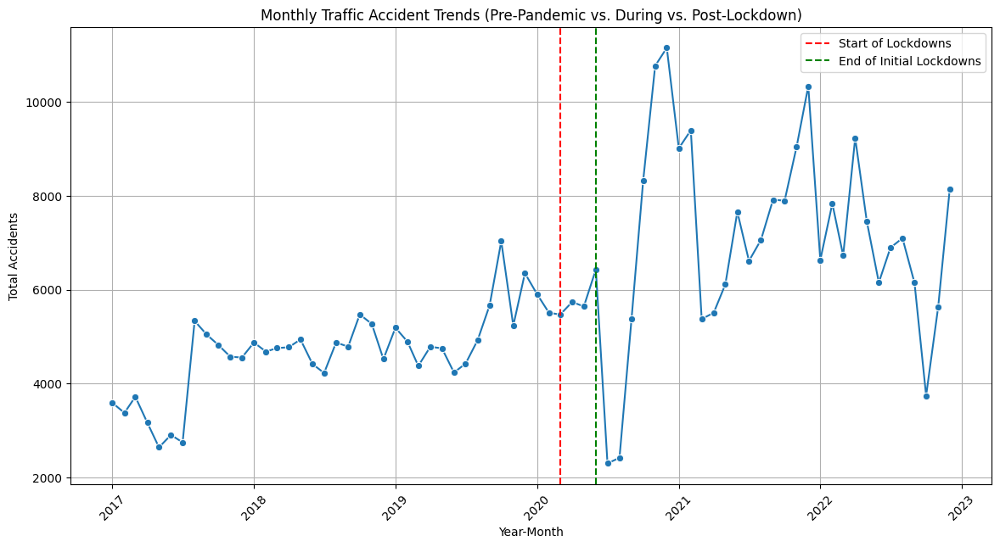

Pre-Pandemic Mean Accidents: 4665.76
Post-Lockdown Mean Accidents: 7132.03
T-Test Statistic: -6.39, P-Value: 0.000000
The difference in accident rates between pre-pandemic and post-lockdown periods is statistically significant.


In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Step 1: Create 'year_month' column for filtering and visual representation
data['year_month'] = pd.to_datetime(data['year'].astype(str) + '-' + data['month'].astype(str))

# Step 2: Group by 'year_month' and calculate total accidents per month using the 'ID' column
monthly_accidents = data.groupby('year_month').agg({'ID': 'count'}).reset_index()
monthly_accidents.rename(columns={'ID': 'total_accidents'}, inplace=True)

# Step 3: Create a COVID-19 indicator column
# Mark different phases of the pandemic: Pre-Pandemic, Lockdown, and Post-Lockdown
monthly_accidents['covid_phase'] = 'Pre-Pandemic'
monthly_accidents.loc[(monthly_accidents['year_month'] >= '2020-03-01') &
                      (monthly_accidents['year_month'] <= '2020-06-01'), 'covid_phase'] = 'Lockdown'
monthly_accidents.loc[monthly_accidents['year_month'] > '2020-06-01', 'covid_phase'] = 'Post-Lockdown'

# Step 4: Plotting the line chart for traffic accident trends with annotations
plt.figure(figsize=(14, 7))
sns.lineplot(x='year_month', y='total_accidents', data=monthly_accidents, marker='o')
plt.axvline(pd.to_datetime('2020-03-01'), color='red', linestyle='--', label='Start of Lockdowns')
plt.axvline(pd.to_datetime('2020-06-01'), color='green', linestyle='--', label='End of Initial Lockdowns')
plt.title('Monthly Traffic Accident Trends (Pre-Pandemic vs. During vs. Post-Lockdown)')
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.ylabel('Total Accidents')
plt.legend()
plt.grid(True)
plt.show()

# Step 5: Statistical Testing - Compare mean accidents in different periods
# Extract data for Pre-Pandemic and Post-Lockdown phases
pre_pandemic = monthly_accidents[monthly_accidents['covid_phase'] == 'Pre-Pandemic']['total_accidents']
post_lockdown = monthly_accidents[monthly_accidents['covid_phase'] == 'Post-Lockdown']['total_accidents']

# T-test for mean comparison
t_stat, p_value = ttest_ind(pre_pandemic, post_lockdown)

# Display Results
print(f"Pre-Pandemic Mean Accidents: {pre_pandemic.mean():.2f}")
print(f"Post-Lockdown Mean Accidents: {post_lockdown.mean():.2f}")
print(f"T-Test Statistic: {t_stat:.2f}, P-Value: {p_value:.6f}")

# Interpretation of Results
if p_value < 0.05:
    print("The difference in accident rates between pre-pandemic and post-lockdown periods is statistically significant.")
else:
    print("There is no statistically significant difference in accident rates between pre-pandemic and post-lockdown periods.")


In [ ]:

# Define high and low investment states
high_investment_states = ['CA', 'NY', 'TX', 'MA']
low_investment_states = ['MT', 'ND', 'WV', 'WY']

# Categorize the states
data['investment_category'] = data['state_x'].apply(
    lambda x: 'High-Investment (e.g., CA, TX, NY)' if x in high_investment_states else 'Low-Investment (e.g., MT, ND, WY)'
)

# Group by year and investment category
region_trends = data.groupby(['year', 'investment_category']).agg(
    total_accidents=('severity', 'size'),
    mean_population=('population', 'mean')
).reset_index()

# Calculate accidents per capita
region_trends['accidents_per_capita'] = region_trends['total_accidents'] / region_trends['mean_population']

# Plot the trends with expanded legend
plt.figure(figsize=(14, 7))
sns.lineplot(x='year', y='accidents_per_capita', hue='investment_category', data=region_trends, marker='o')

# Set title and labels
plt.title('Accidents Per Capita Over Time by Region Investment Category')
plt.xlabel('Year')
plt.ylabel('Accidents Per Capita')
plt.legend(title='Region Investment Categories', fontsize=10, title_fontsize=12)
plt.grid(True)
plt.show()


# 4. Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split
X = numeric_data[['Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)',
                  'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
                  'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']]
Y = numeric_data['Severity']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [ ]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score, classification_report
from scipy import stats

lin_reg = LinearRegression()
lin_reg.fit(X_train, Y_train)

Y_pred = lin_reg.predict(X_test)

In [ ]:
print("\nLinear Regression Results:")
print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred)}")
print(f"R-Squared: {r2_score(Y_test, Y_pred)}")

In [ ]:
X_test_single = X_test['Distance(mi)']

plt.scatter(X_test_single, Y_test, label='Actual')

plt.scatter(X_test_single, Y_pred, label='Predicted')

plt.title('Simple Linear Regression: Severity vs Distance')
plt.xlabel('Distance(mi)')
plt.ylabel('Severity')
plt.legend()

plt.show()

In [ ]:
group1 = numeric_data[(numeric_data['Start_Lat'] > 30) &
                      (numeric_data['Start_Lng'] > -100) &
                      (numeric_data['Temperature(F)'] > 60)]['Severity']

group2 = numeric_data[(numeric_data['Humidity(%)'] > 50) &
                      (numeric_data['Pressure(in)'] > 30) &
                      (numeric_data['Wind_Speed(mph)'] < 10)]['Severity']

In [ ]:
t_stat, p_value = stats.ttest_ind(group1, group2)

print("\nT-Test Results:")
print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")

In [ ]:
from sklearn.preprocessing import StandardScaler

X_ml = numeric_data[['Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)',
                  'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
                  'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']]
Y_ml = data_clean['Severity']

scaler = StandardScaler()
X_ml_scaled = scaler.fit_transform(X_ml)

X_train_ml, X_test_ml, Y_train_ml, Y_test_ml = train_test_split(X_ml_scaled, Y_ml, test_size=0.3, random_state=42)

log_reg = LogisticRegression(max_iter=300)

log_reg.fit(X_train_ml, Y_train_ml)

Y_pred_ml = log_reg.predict(X_test_ml)

from sklearn.metrics import accuracy_score
accuracy = accuracy_score(Y_test_ml, Y_pred_ml)
print(f"Logistic Regression Accuracy: {accuracy * 100:.2f}%")

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(Y_test_ml, Y_pred_ml, zero_division=0))

In [ ]:
# import folium
# from folium.plugins import HeatMap
# import pandas as pd
# m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
# for idx, row in traffic.iterrows():
#     folium.CircleMarker([row['Start_Lat'], row['Start_Lng']],
#                         radius=2,
#                         color='red',
#                         fill=True).add_to(m)

# m.save('accidents_map.html')
# heat_data = [[row['Start_Lat'], row['Start_Lng']] for index, row in traffic.iterrows()]
# HeatMap(heat_data).add_to(m)

# 5. Preliminary Results

Time Trend Analysis (Sub Question 1)


In [ ]:
import pandas as pd

# Assuming your cleaned data is in a DataFrame called 'data' with 'start_time' column as datetime
# Step 1: Create 'year_month' column for monthly aggregation
data['year_month'] = data['start_time'].dt.to_period('M')

# Step 2: Aggregate accident counts by month
monthly_accidents = data.groupby('year_month').agg(
    total_accidents=('severity', 'size'),   # Counting accidents
    mean_population=('population', 'mean')  # Averaging population for normalization
).reset_index()

# Step 3: Calculate accidents per capita
monthly_accidents['accidents_per_capita'] = monthly_accidents['total_accidents'] / monthly_accidents['mean_population']

# Step 4: Set 'year_month' as the index for the time series
monthly_accidents.set_index('year_month', inplace=True)


In [ ]:
# Display the first few rows to see the column structure
print(data.head())

# Get unique state names from the 'state_x' column
unique_states = data['state_x'].unique()
print(unique_states)


          id   source  severity          start_time            end_time  \
0  A-2047758  Source2         2 2019-06-12 10:10:56 2019-06-12 10:55:58   
3  A-4237356  Source1         2 2022-02-21 17:43:04 2022-02-21 19:43:23   
4  A-6690583  Source1         2 2020-12-04 01:46:00 2020-12-04 04:13:09   
5  A-1101469  Source2         2 2021-03-29 07:03:58 2021-03-29 08:51:01   
6  A-7222249  Source1         2 2020-01-14 16:49:23 2020-01-14 20:49:23   

   start_lat   start_lng    end_lat     end_lng  distance(mi)  ...  \
0  30.641211  -91.153481  35.822576  -87.729446         0.000  ...   
3  43.680592  -92.993317  43.680574  -92.972223         1.054  ...   
4  35.395484 -118.985176  35.395476 -118.985995         0.046  ...   
5  42.532082  -70.944267  35.822576  -87.729446         0.000  ...   
6  42.421280 -123.119450  42.421280 -123.119450         0.000  ...   

  nautical_twilight astronomical_twilight     state_full        state_y  \
0               Day                   Day      louisi

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima

# Assuming your cleaned data is in a DataFrame called 'data' with 'start_time' column as datetime

# Define lists of high and low investment states
high_investment_states = ['CA', 'TX', 'FL', 'NY', 'IL', 'PA', 'OH', 'GA',
                          'NC', 'MI', 'NJ', 'VA', 'WA', 'AZ', 'MA', 'TN',
                          'IN', 'MO', 'MD', 'WI', 'MN', 'CO', 'SC', 'AL',
                          'KY']

low_investment_states = ['WY', 'VT', 'ND', 'SD', 'DE', 'RI', 'MT', 'ME', 'NH',
                         'ID', 'WV', 'AK', 'NE', 'AR', 'MS', 'HI', 'IA', 'KS', 'CT',
                         'OR', 'UT', 'NM', 'LA', 'TN', 'MI']

# Filter data for high and low investment states
high_investment_data = data[data['state_x'].isin(high_investment_states)]
low_investment_data = data[data['state_x'].isin(low_investment_states)]

# Monthly aggregation for high investment states
monthly_high_investment = high_investment_data.groupby('year_month').agg(
    total_accidents=('severity', 'size'),
    mean_population=('population', 'mean')
).reset_index()

monthly_high_investment['accidents_per_capita'] = monthly_high_investment['total_accidents'] / monthly_high_investment['mean_population']
monthly_high_investment.set_index('year_month', inplace=True)

# First-order differencing for high investment data
accidents_high_series_diff = monthly_high_investment['accidents_per_capita'].diff().dropna()

# Perform ADF test again to check stationarity
result_high_diff = adfuller(accidents_high_series_diff)
print(f'ADF Statistic for Differenced High Investment: {result_high_diff[0]}, p-value: {result_high_diff[1]}')

# Fit the ARIMA model for high investment states
stepwise_fit_high = auto_arima(accidents_high_series_diff,
                                 start_p=1, start_q=1,
                                 max_p=3, max_q=3,
                                 seasonal=False,  # Set to True if seasonality is detected
                                 trace=True,
                                 error_action='ignore',
                                 suppress_warnings=True,
                                 stepwise=True)

# Print the summary of the stepwise model fit for high investment states
print(stepwise_fit_high.summary())

# Monthly aggregation for low investment states
monthly_low_investment = low_investment_data.groupby('year_month').agg(
    total_accidents=('severity', 'size'),
    mean_population=('population', 'mean')
).reset_index()

monthly_low_investment['accidents_per_capita'] = monthly_low_investment['total_accidents'] / monthly_low_investment['mean_population']
monthly_low_investment.set_index('year_month', inplace=True)

# First-order differencing for low investment data
accidents_low_series_diff = monthly_low_investment['accidents_per_capita'].diff().dropna()

# Perform ADF test again to check stationarity for low investment states
result_low_diff = adfuller(accidents_low_series_diff)
print(f'ADF Statistic for Differenced Low Investment: {result_low_diff[0]}, p-value: {result_low_diff[1]}')

# Fit the ARIMA model for low investment states
stepwise_fit_low = auto_arima(accidents_low_series_diff,
                                start_p=1, start_q=1,
                                max_p=3, max_q=3,
                                seasonal=False,  # Set to True if seasonality is detected
                                trace=True,
                                error_action='ignore',
                                suppress_warnings=True,
                                stepwise=True)

# Print the summary of the stepwise model fit for low investment states
print(stepwise_fit_low.summary())


ADF Statistic for Differenced High Investment: -6.7106037729916945, p-value: 3.6890252861645826e-09
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-834.196, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-838.198, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-836.199, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-836.119, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-836.537, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0]          
Total fit time: 2.765 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   71
Model:                        SARIMAX   Log Likelihood                 420.099
Date:                Mon, 30 Sep 2024   AIC                           -838.198
Time:                        05:31:52   BIC                           -835.935
Sample:                    02-28-2017   HQIC           

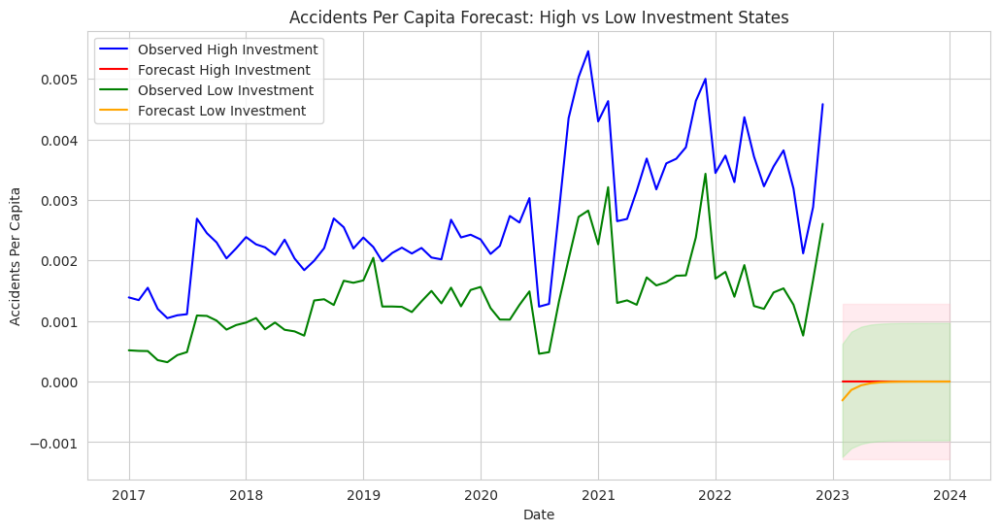

In [ ]:
# Forecast the next 12 months for high investment states
n_periods = 12
forecast_high, conf_int_high = stepwise_fit_high.predict(n_periods=n_periods, return_conf_int=True)

# Create a time index for the forecast for high investment states
last_period_high = monthly_high_investment.index[-1].to_timestamp()  # Convert to timestamp
forecast_index_high = pd.date_range(start=last_period_high + pd.DateOffset(months=1), periods=n_periods, freq='M')

# Forecast the next 12 months for low investment states
forecast_low, conf_int_low = stepwise_fit_low.predict(n_periods=n_periods, return_conf_int=True)

# Create a time index for the forecast for low investment states
last_period_low = monthly_low_investment.index[-1].to_timestamp()  # Convert to timestamp
forecast_index_low = pd.date_range(start=last_period_low + pd.DateOffset(months=1), periods=n_periods, freq='M')

# Plotting
plt.figure(figsize=(12, 6))

# High Investment States
plt.plot(monthly_high_investment.index.to_timestamp(), monthly_high_investment['accidents_per_capita'], label='Observed High Investment', color='blue')
plt.plot(forecast_index_high, forecast_high, label='Forecast High Investment', color='red')
plt.fill_between(forecast_index_high, conf_int_high[:, 0], conf_int_high[:, 1], color='pink', alpha=0.3)

# Low Investment States
plt.plot(monthly_low_investment.index.to_timestamp(), monthly_low_investment['accidents_per_capita'], label='Observed Low Investment', color='green')
plt.plot(forecast_index_low, forecast_low, label='Forecast Low Investment', color='orange')
plt.fill_between(forecast_index_low, conf_int_low[:, 0], conf_int_low[:, 1], color='lightgreen', alpha=0.3)

plt.title('Accidents Per Capita Forecast: High vs Low Investment States')
plt.xlabel('Date')
plt.ylabel('Accidents Per Capita')
plt.legend()
plt.show()

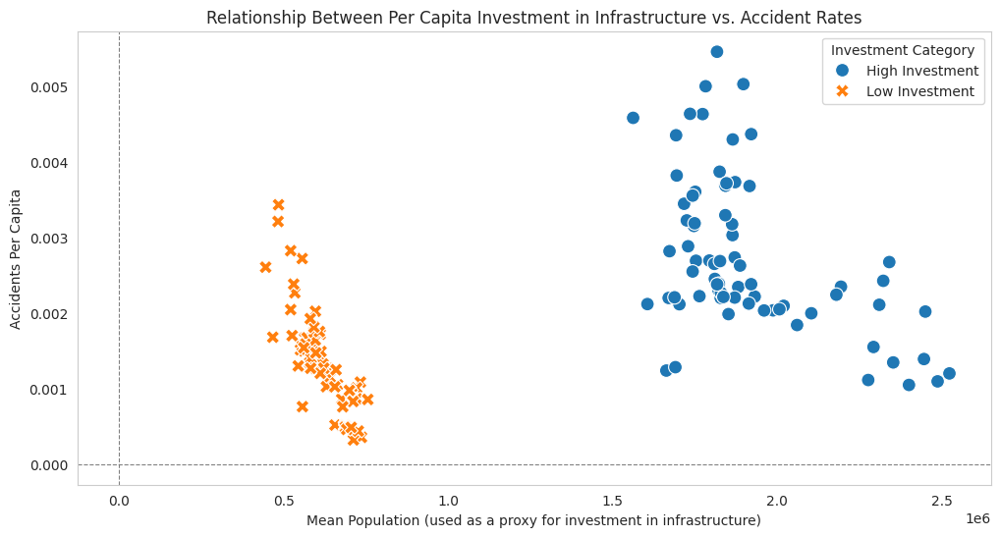

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming monthly_high_investment and monthly_low_investment have been calculated and include 'accidents_per_capita'
# Include state information for both DataFrames

# Add a state column to each DataFrame
monthly_high_investment['investment_category'] = 'High Investment'
monthly_low_investment['investment_category'] = 'Low Investment'

# Concatenate the two DataFrames
combined_data = pd.concat([monthly_high_investment, monthly_low_investment])

# Reset the index for plotting
combined_data.reset_index(inplace=True)

# Set the plot size
plt.figure(figsize=(12, 6))

# Scatter plot
sns.scatterplot(data=combined_data, x='mean_population', y='accidents_per_capita', hue='investment_category', style='investment_category', s=100)

# Labels and title
plt.title('Relationship Between Per Capita Investment in Infrastructure vs. Accident Rates')
plt.xlabel('Mean Population (used as a proxy for investment in infrastructure)')
plt.ylabel('Accidents Per Capita')
plt.axhline(0, color='gray', linewidth=0.8, ls='--')  # Add a horizontal line at y=0
plt.axvline(0, color='gray', linewidth=0.8, ls='--')  # Add a vertical line at x=0
plt.grid()
plt.legend(title='Investment Category')
plt.show()


In [ ]:
import pandas as pd
import statsmodels.api as sm

# Create a DataFrame for regression analysis
# Use pd.concat() to combine the series
accidents_data = pd.DataFrame({
    'mean_population': pd.concat([monthly_high_investment['mean_population'], monthly_low_investment['mean_population']]),
    'accidents_per_capita': pd.concat([monthly_high_investment['accidents_per_capita'], monthly_low_investment['accidents_per_capita']]),
    'investment_category': ['High'] * len(monthly_high_investment) + ['Low'] * len(monthly_low_investment)
})

# Add a constant for intercept
X = sm.add_constant(accidents_data['mean_population'])
y = accidents_data['accidents_per_capita']

# Fit the regression model
model = sm.OLS(y, X).fit()

# Get the summary of the regression
print(model.summary())


                             OLS Regression Results                             
Dep. Variable:     accidents_per_capita   R-squared:                       0.251
Model:                              OLS   Adj. R-squared:                  0.246
Method:                   Least Squares   F-statistic:                     47.59
Date:                  Mon, 30 Sep 2024   Prob (F-statistic):           1.60e-10
Time:                          05:49:05   Log-Likelihood:                 799.31
No. Observations:                   144   AIC:                            -1595.
Df Residuals:                       142   BIC:                            -1589.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.

# **DONT USE ANYTHING PAST THIS. OLD CODE**

Spatial Analysis (Sub Question 2: Geographic Distribution)

In [ ]:
# Heatmap using folium for Spacial distribution
import folium
from folium.plugins import HeatMap

# Create a base map centered at the average location
accident_locations = data_clean[['Start_Lat', 'Start_Lng']].dropna()
map = folium.Map(location=[accident_locations['Start_Lat'].mean(), accident_locations['Start_Lng'].mean()], zoom_start=5)

# Add a heatmap layer
HeatMap(accident_locations.values, radius=8).add_to(map)
map


Positive vs. Negative Correlation: You’ll see which weather factors are positively or negatively correlated with accident severity. For example, higher precipitation might correlate with higher severity, while higher visibility might correlate with lower severity.

Strength of Correlations: The heatmap helps quickly identify which factors have stronger correlations with severity and among each other.

In [ ]:
# Accidents by State
accidents_by_state = data_clean.groupby('State')['ID'].count().sort_values(ascending=False)
accidents_by_state.plot(kind='bar', title='Accidents by State', figsize=(10, 6))
plt.xlabel('State')
plt.ylabel('Number of Accidents')
plt.show()


Environmental Factors (Sub Question 2: Impact of Weather Conditions)

In [ ]:
# Get all unique weather conditions in the dataset
unique_weather_conditions = data_clean['Weather_Condition'].unique()

# Display the unique weather conditions
print(unique_weather_conditions)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extended mapping for the remaining unmapped weather conditions
weather_group_map = {
    # Clear weather
    'Clear': 'Clear', 'Fair': 'Clear', 'Fair / Windy': 'Clear',

    # Cloudy weather
    'Cloudy': 'Cloudy', 'Partly Cloudy': 'Cloudy', 'Mostly Cloudy': 'Cloudy', 'Overcast': 'Cloudy',
    'Scattered Clouds': 'Cloudy', 'Cloudy / Windy': 'Cloudy', 'Partly Cloudy / Windy': 'Cloudy', 'Mostly Cloudy / Windy': 'Cloudy',

    # Rainy weather
    'Light Rain': 'Rain', 'Heavy Rain': 'Rain', 'Rain': 'Rain', 'Drizzle': 'Rain', 'Light Drizzle': 'Rain',
    'Heavy Drizzle': 'Rain', 'Rain Shower': 'Rain', 'Showers in the Vicinity': 'Rain', 'Heavy Rain / Windy': 'Rain',
    'Rain / Windy': 'Rain', 'Light Rain Showers': 'Rain', 'Light Rain Shower': 'Rain', 'Rain Showers': 'Rain',
    'Light Rain / Windy': 'Rain', 'Light Drizzle / Windy': 'Rain', 'Drizzle and Fog': 'Rain', 'Light Rain Shower / Windy': 'Rain',
    'Drizzle / Windy': 'Rain',  # Added condition

    # Thunderstorms
    'Thunderstorm': 'Thunderstorm', 'Thunder': 'Thunderstorm', 'T-Storm': 'Thunderstorm',
    'Light Thunderstorms and Rain': 'Thunderstorm', 'Heavy T-Storm': 'Thunderstorm', 'T-Storm / Windy': 'Thunderstorm',
    'Thunderstorms and Rain': 'Thunderstorm', 'Light Rain with Thunder': 'Thunderstorm', 'Thunder / Windy': 'Thunderstorm',
    'Heavy T-Storm / Windy': 'Thunderstorm', 'Heavy Thunderstorms and Rain': 'Thunderstorm', 'Thunder in the Vicinity': 'Thunderstorm',
    'Thunder / Wintry Mix': 'Thunderstorm', 'Light Thunderstorms and Snow': 'Thunderstorm',

    # Snowy weather
    'Snow': 'Snow', 'Light Snow': 'Snow', 'Heavy Snow': 'Snow', 'Snow and Sleet': 'Snow', 'Blowing Snow': 'Snow',
    'Heavy Snow / Windy': 'Snow', 'Snow / Windy': 'Snow', 'Blowing Snow / Windy': 'Snow',
    'Light Snow Showers': 'Snow', 'Light Snow Shower': 'Snow', 'Snow and Thunder': 'Snow', 'Light Snow and Sleet': 'Snow',
    'Light Snow / Windy': 'Snow', 'Light Snow with Thunder': 'Snow', 'Light Snow and Sleet / Windy': 'Snow',
    'Snow and Sleet / Windy': 'Snow', 'Light Blowing Snow': 'Snow', 'Drifting Snow / Windy': 'Snow', 'Light Snow Grains': 'Snow',
    'Snow Grains': 'Snow',  # Added condition

    # Fog and mist
    'Fog': 'Fog', 'Mist': 'Fog', 'Haze': 'Fog', 'Shallow Fog': 'Fog', 'Fog / Windy': 'Fog', 'Haze / Windy': 'Fog',
    'Mist / Windy': 'Fog', 'Light Haze': 'Fog', 'Patches of Fog': 'Fog', 'Partial Fog': 'Fog', 'Partial Fog / Windy': 'Fog',
    'Light Freezing Fog': 'Fog',  # Added condition

    # Winter weather and wintry mix
    'Wintry Mix': 'Winter Weather', 'Sleet': 'Winter Weather', 'Freezing Rain': 'Winter Weather',
    'Light Freezing Rain': 'Winter Weather', 'Heavy Freezing Rain': 'Winter Weather',
    'Wintry Mix / Windy': 'Winter Weather', 'Sleet / Windy': 'Winter Weather', 'Light Sleet': 'Winter Weather',
    'Light Freezing Rain / Windy': 'Winter Weather', 'Light Ice Pellets': 'Winter Weather', 'Light Freezing Drizzle': 'Winter Weather',
    'Freezing Drizzle': 'Winter Weather', 'Heavy Freezing Drizzle': 'Winter Weather', 'Ice Pellets': 'Winter Weather',
    'Small Hail': 'Winter Weather', 'Hail': 'Winter Weather', 'Light Hail': 'Winter Weather',  # Added condition

    # Other uncommon conditions
    'N/A Precipitation': 'Other', 'Volcanic Ash': 'Other', 'Sand': 'Other', 'Sand / Dust Whirlwinds': 'Other',
    'Widespread Dust': 'Other', 'Widespread Dust / Windy': 'Other', 'Smoke': 'Other', 'Smoke / Windy': 'Other',
    'Squalls': 'Other', 'Squalls / Windy': 'Other', 'Funnel Cloud': 'Other', 'Low Drifting Snow': 'Other',
    'Blowing Dust': 'Other', 'Blowing Dust / Windy': 'Other', 'Heavy Sleet': 'Other', 'Thunder and Hail': 'Other',
}

# Step 1: Apply the weather group mapping to create a new grouped column
data_clean['Weather_Condition_Grouped'] = data_clean['Weather_Condition'].replace(weather_group_map)

# Handle any weather conditions that were not mapped by grouping them as 'Other'
data_clean['Weather_Condition_Grouped'] = data_clean['Weather_Condition_Grouped'].fillna('Other')

# Step 2: Get the counts for each grouped weather condition
weather_condition_grouped_counts = data_clean['Weather_Condition_Grouped'].value_counts()

# Step 3: Plot the bar chart using the grouped weather conditions
plt.figure(figsize=(10, 6))

# Flip the axes by switching x and y in sns.barplot
sns.barplot(y=weather_condition_grouped_counts.index, x=weather_condition_grouped_counts.values, palette='Set2')

# Add title and labels
plt.title('Accidents per Grouped Weather Condition', fontsize=14)
plt.xlabel('Number of Accidents', fontsize=12)
plt.ylabel('Weather Condition', fontsize=12)

plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style for better aesthetics
sns.set_style('whitegrid')

# List of relevant road feature columns
road_features = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit',
                 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal']

# Initialize an empty dictionary to store counts
road_feature_counts = {}

# Count accidents where each feature is present (True) vs absent (False)
for feature in road_features:
    road_feature_counts[feature] = data_clean[feature].value_counts()

# Create a DataFrame from the dictionary for easier plotting
road_feature_df = pd.DataFrame(road_feature_counts)

# Plot the data using a stacked bar plot with a customized color palette
plt.figure(figsize=(12, 7))
road_feature_df.T.plot(kind='bar', stacked=True, figsize=(12, 7), color=['#FF9999', '#66B2FF'])

# Add title, labels, and legend
plt.title('Accidents by Road Feature Presence', fontsize=16, fontweight='bold')
plt.xlabel('Road Feature', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(['Absent', 'Present'], title='Feature Present', fontsize=12)

# Add data labels to each bar for better readability
for container in plt.gca().containers:
    plt.gca().bar_label(container, fmt='%d', label_type='center', fontsize=10, padding=3)

plt.tight_layout()
plt.show()



In [ ]:
# Accident Severity by Road Feature
sns.set_style('whitegrid')

severity_by_road_feature = data_clean.groupby(['Severity'])[road_features].sum()

# Transpose the data for plotting
severity_by_road_feature_T = severity_by_road_feature.T

# Plot the severity distribution for each road feature as grouped bars
plt.figure(figsize=(14, 8))
severity_by_road_feature_T.plot(kind='bar', figsize=(14, 8),
                                color=sns.color_palette('coolwarm', n_colors=len(severity_by_road_feature_T.columns)))

# Add title, labels, and legend
plt.title('Accident Severity by Road Feature', fontsize=16, fontweight='bold')
plt.xlabel('Road Feature', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Severity', fontsize=12)

# Adjust the layout for better readability
plt.tight_layout()

# Show the plot
plt.show()


Correlation Analysis

In [ ]:
# Correlation Heatmap for Numerical Features and Severity
# Select the numerical columns, including 'Severity'
numerical_columns = ['Severity', 'Temperature(F)', 'Wind_Speed(mph)', 'Visibility(mi)',
                     'Humidity(%)', 'Pressure(in)', 'Precipitation(in)']

# Filter the dataset to only include those numerical columns
numerical_data = data_clean[numerical_columns]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Add title
plt.title('Correlation Heatmap: Numerical Features and Severity', fontsize=16, fontweight='bold')

# Show the plot
plt.tight_layout()
plt.show()

Outlier Dectection and Handling

Feature Imprtance for Prediction (Sub Question 3: Machine Learning)

Predictive Modeling (Sub-Question 3: Predicting Accident Severity)

In [ ]:
# Heatmap with weight based on accident severity
# Create a base map centered at the average location
accident_locations = data_clean[['Start_Lat', 'Start_Lng', 'Severity']].dropna()

# Initialize the map at the mean accident location
map = folium.Map(location=[accident_locations['Start_Lat'].mean(), accident_locations['Start_Lng'].mean()], zoom_start=5)

# Prepare data for the heatmap using accident severity as a weight
heat_data = [[row['Start_Lat'], row['Start_Lng'], row['Severity']] for index, row in accident_locations.iterrows()]

# Add a heatmap layer, using severity to weigh the intensity of each point
HeatMap(heat_data, radius=8, max_zoom=13).add_to(map)

# Show the map
map


This second heatmap not only helps **identify high-risk** areas but also where both frequency and severity of accidents are factors.